In [1]:
import numpy as np
import numpy.linalg as npl
from scipy import signal
from scipy import interpolate
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib as mpl
import time
import copy
import warnings
import scipy.signal as scs
warnings.filterwarnings('ignore')
import cv2

Le principe de la compression par estimation de mouvement ou "block matching" est de découper 2 images consécutives en blocs de tailles égales puis de trouver les déplacements de chaque bloc d'une image à l'autre.

En procedant ainsi on remplace une image par une matrice des vecteurs déplacement, de taille moins lourde.

D'un point de vue pratique, on définit une zone de recherche dans notre image de référence dans laquelle on va essayer de situer un bloc issu de l'image à prédire. 

La première étape de l'estimation de mouvement consiste donc à définir les paramètres de l'algorithme qui sont :
* La taille des macroblocs, ou "block size"
* La marge, ou "padding", qui définit la définit de la zone de recherche

In [51]:
## Paramètres
p = 7
bs = 16
## Norme utilisée pour calculer la similarité
similarity_metric = "SSD" # Dispo ("CORR", "FRO", "SAD", "SSD")
# Paramètre debug qui permet d'étudier le calcul du déplacement bloc par bloc
debug = False
# Ouverture des images
img_t = np.array(Image.open("img/1.jpg"))[:,:,0]
img_tp1 = np.array(Image.open("img/2.jpg"))[:,:,0]

L'étape centrale de l'algorithme consiste à parcourir les blocs de l'image à prédire et d'effectuer le calcul du vecteur déplacement entre le bloc de l'image à predire et l'image de référence. La fonction encode_motion retourne un tableau de vecteurs déplacement qu'on utilise pour le décodage.

In [58]:
def encode_motion(iref, ipred, bs, p, metric, debug):
    """
    Parcours des blocs et calcul du déplacement
    """
    n, m = np.shape(ipred)[:2]
    ncol = int(m // bs)
    nrow = int(n // bs)
    u = np.zeros((nrow*ncol, 2))
    f = 2 * p + 1
    print(">> Similarity metric used : ",metric)
    print(f">> {nrow * ncol} blocs | {int((bs + 2 * p) // (bs/f) - (f - 2))**2} comparaisons par bloc")
    if debug :
        nrow = 1
    for i in range(nrow):
        for j in range(ncol):
            search_zone = iref[i * bs : (1 + i) * bs + 2 * p, j * bs : (1 + j) * bs + 2*p]
            block = ipred[i * bs : (1 + i) * bs, j * bs : (j + 1) * bs]
            u[i * ncol + j, 0], u[i * ncol + j, 1] =  calcul_deplacement(search_zone, block, bs, p, metric, debug)
            if debug == True and j == 4:
                break
            if ((i * ncol + j) / (nrow * ncol) * 100 ) % 10 == 0:
                print(f'Progression : {(i * ncol + j) / (nrow * ncol) * 100 }%')
    print("Déplacement moyen sur toute l'image :", np.mean(u[:,0]), np.mean(u[:,1]))
    return u

Pour calculer le déplacement entre le macrobloc de l'image à prédire et le bloc de l'image de référence, il n'y a pas de contrainte dans le standard MPEG. Dans notre cas on utilise la méthode la plus basique, c'est à dire la recherche exhaustive. La recherche exhaustive consiste simplement à tester toutes les positions possibles du macrobloc dans la zone de recherche. Par exemple dans le cas ou la taille du macrobloc est de 16x16 et le padding est de 7px, il y a 255 positions à tester.

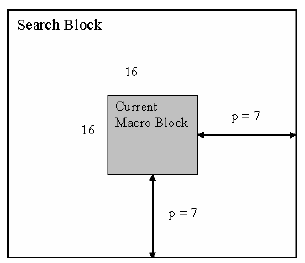

In [53]:
def calcul_deplacement(search_zone, block, bs, p, metric, debug):
    """
    Recherche exhaustive sur la zone de recherche et calcul de la similarité
    
    Normes disponibles pour le calcul de similarité :
    * Frobenius 
    * Sum of Squared Differences (SSD)
    * Sum of Absolute Differences (SAD)
    * Correlation
    
    """
    
    # Variables
    n,m = np.shape(search_zone)
    s = 1 # stride (inutile)
    f = 2 * p + 1 # facteur de recouvrement
    ncol = int(m // (bs/f) - (f - 2))
    nrow = int(n // (bs/f) - (f - 2))    
    
    if metric == "CORR":
        # Normalisation (en phase de test)
        search_zone = search_zone.astype('float32')
        block = block.astype('float32')
        search_zone -= search_zone.mean()
        search_zone = search_zone / search_zone.std()
        block -= block.mean()
        block = block / block.std()
        # Calcul de similarité avec la corrélation (fait le parcours exhaustif automatiquement)
        corr = signal.correlate2d(search_zone,block, "valid") # Valid important !
        y, x = np.unravel_index(np.argmax(corr), corr.shape) # Trick python pour trouver le max d'une matrice
        n2, m2 = corr.shape
        # Recentrage pour obtenir le vecteur déplacement
        y_opti = y - n2//2
        x_opti = x - m2//2

        if debug:
            # Affichage du bloc selectionné par la corrélation
            fig, ax = plt.subplots(1,3, figsize=(18,7))
            ax[0].imshow(search_zone)
            ax[0].scatter(x_opti+ bs//2 + p, y_opti+ bs//2 + p, c="r")
            rect = patches.Rectangle( (x, y) ,bs,bs,linewidth=1,edgecolor='k',facecolor='none')    
            ax[0].add_patch(rect)
            ax[1].imshow(block)
            ax[1].scatter(bs // 2, bs // 2, c='r')
            ax[2].imshow(corr)
            plt.show()
            print("Cordonnées du max de corrélation :", y, x)
            print("Coordonnées du déplacement optimal recentré", x_opti, y_opti)
            input()
        
    else :
        # Cas général
        # On fait le parcours manuellement et on calcul la similarité avec la norme 2

        CF = np.zeros((nrow * ncol, 3)) # On garde les résultats de chaque position testées en mémoire ici

        for i in range(nrow) :
            for j in range(ncol) :
                # On se repère par rapport au centre du bloc
                x_mid_block, y_mid_block = int((j/f) * bs + bs // 2 ) , int((i/f) * bs + bs // 2)
                left = x_mid_block - (bs//2)
                right = x_mid_block + (bs//2)
                down = y_mid_block - (bs//2)
                up = y_mid_block + (bs//2)
            
                # Calcul de la similarité avec différentes normes
                img = block - search_zone[left:right , down:up]
                
                if metric == "FRO" :
                    cost = npl.norm(img, "fro")                    
                elif metric == "SAD" :
                    cost = np.sum(np.abs(img))
                elif metric == "SSD" : # Correspond à la norme de frobenius mais avec une normalisation wtf de numpy sur le carré
                    cost = np.sqrt(np.sum(img**2))
                    
                # Remplissage du tableau de mémoire
                # Conversion milieu du bloc vers milieu de la zone de recherche -> on obtient le déplacement testé
                CF[i * ncol + j, 0] = y_mid_block - bs//2 - p 
                CF[i * ncol + j, 1] = x_mid_block - bs//2 - p 
                CF[i * ncol + j, 2] = cost

        if np.max(CF[:,2]) == np.min(CF[:,2]):
            # Si norme constante sur toutes les positions on choisi un déplacement de 0 manuellement
            x_opti, y_opti = 0, 0
        else : 
            id_min = np.argmin(CF[:,2])
            x_opti = CF[id_min, 0]
            y_opti = CF[id_min, 1]
        
        if debug:
            show_displacement(search_zone, block, p, CF, id_min)
            print("Coordonnées du déplacement optimal recentré", x_opti, y_opti)
            input()
    return x_opti, y_opti

In [54]:
def decode_motion(iref, ipred, u, bs, p):
    """
    Reconstruit une image à partir d'un tableau de déplacement et d'une image de référence.
    """
    n, m = np.shape(ipred)[:2]
    ncol = int(m // bs)
    nrow = int(n // bs)
    decoded = np.zeros(ipred.shape)
    for i in range(nrow):
        for j in range(ncol):
            ux = u[i * ncol + j, 0]
            uy = u[i * ncol + j, 1]
            iref_motioned = np.roll(np.roll(iref,-int(round(uy)),axis=0),-int(round(ux)),axis=1)
            decoded[i * bs :bs * (1 + i),j * bs :bs * (j + 1)] = iref_motioned[p + i * bs: p+ bs * (1 + i),p + j * bs :p + bs * (j + 1)]
    return decoded

Dans la fonction suivante (Proof Of Concept), on combine toutes les fonctions décrites ci-dessus pour encoder une image, la reconstruire et étudier l'erreur de reconstruction

In [55]:
def POC(im_t, im_tp1, bs, p, metric, debug = False):
    n,m = np.shape(im_t)
    # On rogne l'image pour tomber juste avec la taille macroblock choisie
    n_crop = n // bs  * bs
    m_crop = m // bs  * bs
    # Le flip sert juste à avoir un affichage dans le bon sens pour plt.imshow
    img_t_flipped_cropped = np.flip(im_t[:n_crop,:m_crop], axis = 0)
    img_tp1_flipped_cropped = np.flip(im_tp1[:n_crop,:m_crop], axis = 0)
    # On ajoute le padding à l'image de référence (constant égal à 0)
    iref = cv2.copyMakeBorder(img_t_flipped_cropped, p,p,p,p, cv2.BORDER_CONSTANT)
    n,m = np.shape(iref)
    ipred = np.copy(img_tp1_flipped_cropped)
    print('> Encoding ...')
    u = encode_motion(iref, ipred, bs, p, metric, debug)
    print(">>> Done")
    if not debug:
        print('> Decoding ...')
        decoded = decode_motion(iref, ipred, u, bs, p)
        fig, ax = plt.subplots(2,1, figsize = (20,28))
        ax[0].pcolormesh(ipred-decoded).set_cmap("magma")
        ax[0].set_title('Erreur (pas absolue)')
        ax[1].pcolormesh(decoded)
        ax[1].set_title("Image prédite")
        print(">>> Norme de l'erreur", npl.norm(ipred-decoded))
        
    else: 
        decoded = None
    return decoded, ipred

In [56]:
def show_displacement(search_zone, block, p, CF, id_min):
    """
    Outil de débuggage : 
    Permet de regarder quel est le déplacement optimal obtenu pour chaque bloc
    pendant le calcul du déplacement
    """
    # Conversion milieu de la zone de recherche vers milieu du bloc
    x_opti = CF[id_min, 0] + bs//2 + p
    y_opti = CF[id_min, 1] + bs//2 + p
    n,m = np.shape(search_zone)

    fig, ax = plt.subplots(1,2, figsize=(14,4))
    ## Search Zone
    ax[0].pcolormesh(search_zone)
    ax[0].set_title(f"Zone de recherche {search_zone.shape} | COST = {CF[id_min, 2]:.2f} | Position # {id_min}")
    ax[0].scatter(x_opti , y_opti, c= 'r')
    rect = patches.Rectangle( (x_opti - bs // 2 , y_opti - bs // 2) ,bs,bs,linewidth=1,edgecolor='k',facecolor='none')    
    horiz_bar = patches.Rectangle( (x_opti, 0), 0, n, edgecolor="r")
    vert_bar = patches.Rectangle( (0, y_opti), m, 0, edgecolor="r")
    ax[0].add_patch(horiz_bar)
    ax[0].add_patch(vert_bar)
    ax[0].add_patch(rect)
    
    ## Block
    ax[1].pcolormesh(block)
    ax[1].set_title(f"Bloc à situer | Size : {block.shape}")
    ax[1].scatter(bs//2, bs//2, c='r')
    horiz_bar = patches.Rectangle( (0, bs//2), bs, 0, edgecolor="r")
    vert_bar = patches.Rectangle( (bs//2, 0), 0, bs, edgecolor="r")
    ax[1].add_patch(horiz_bar)
    ax[1].add_patch(vert_bar)
    
    plt.suptitle(f"Déplacement : {CF[id_min, 0]}, {CF[id_min, 1]}", fontsize=12)

    ## Pour afficher toutes les position sur la search zone
    #     rect = patches.Rectangle( (int((j/f) * bs), int((i/f) * bs)) ,bs,bs,linewidth=1,edgecolor='k',facecolor='none')
    #     ax[0].scatter(int((j/f) * bs + bs // 2 ) , int((i/f) *bs + bs // 2), c= 'r')


    plt.show()

> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -1.9431592039800996 0.8986318407960199
>>> Done
> Decoding ...
>>> Norme de l'erreur 35566.023857046486


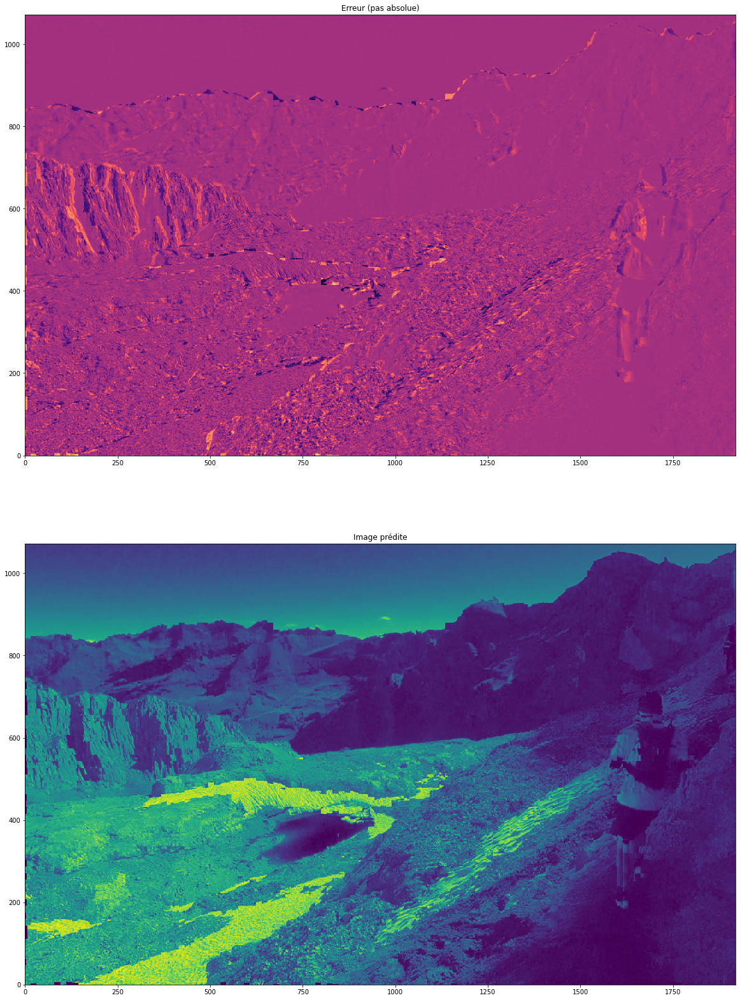

In [18]:
decoded, ipred = POC(img_t, img_tp1, bs, p, similarity_metric, debug)

**Remarque** : En utilisant la norme de Frobenius, le résultat est le suivant. Cette norme n'est pas du tout adapté à ce type de problème.

> Encoding ...
>> Similarity metric used :  FRO
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -0.025 0.6789800995024876
>>> Done
> Decoding ...
>>> Norme de l'erreur 46074.140122198696


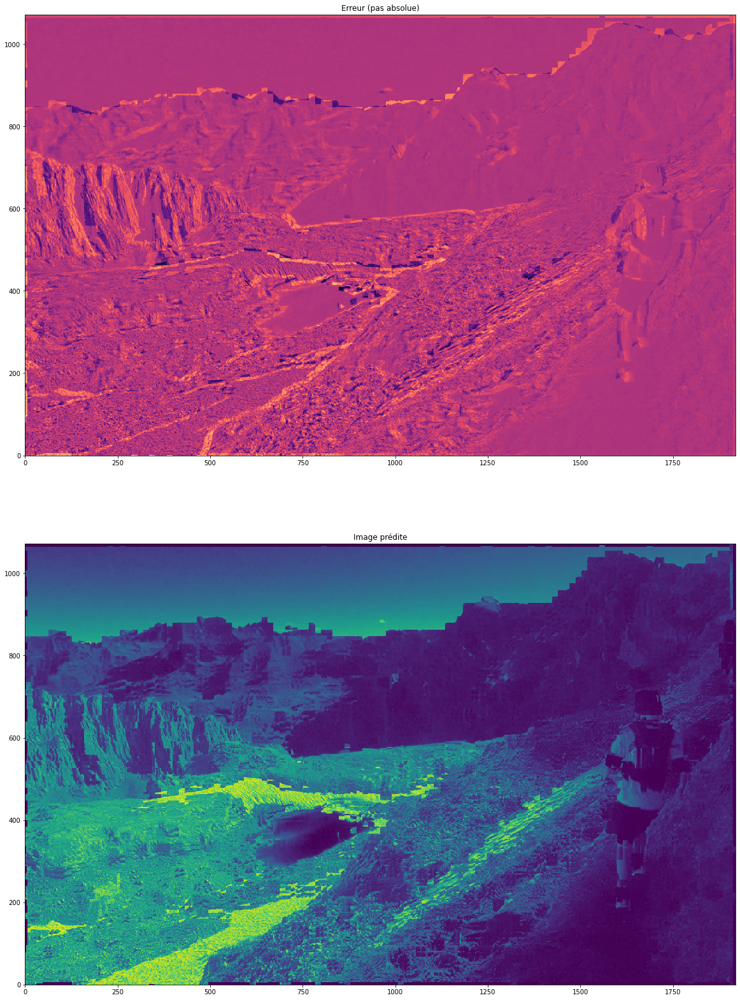

In [21]:
decoded, ipred = POC(img_t, img_tp1, bs, p, "FRO", debug)

## Bloc par bloc

On observe ici le déroulement du calcul du déplacement optimal. Sur l'image de gauche on affiche la zone de recherche et on marque par un carré noir l'emplacement du macrobloc, affiché à droite, d'après la mesure de similarité.

On affiche 5 exemples ci-dessous.

> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc


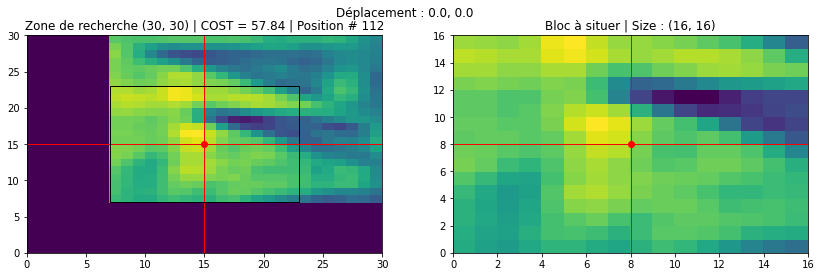

Coordonnées du déplacement optimal recentré 0.0 0.0


Progression : 0.0%


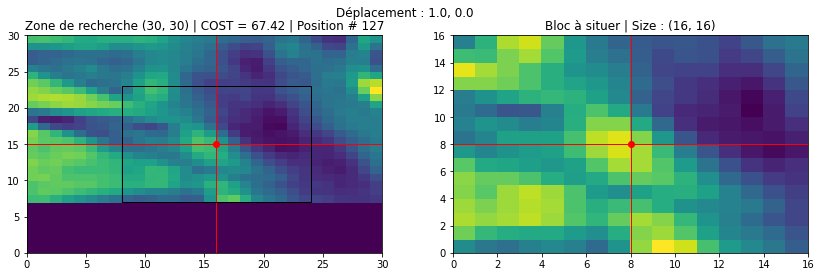

Coordonnées du déplacement optimal recentré 1.0 0.0


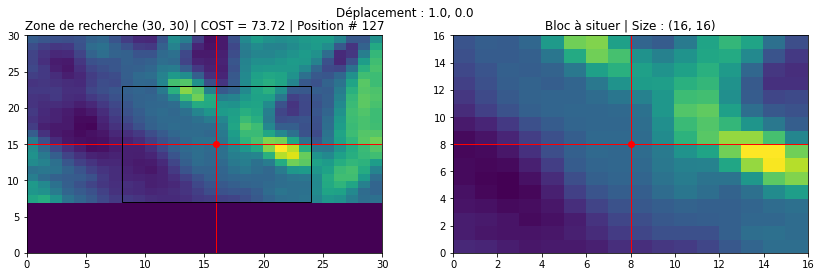

Coordonnées du déplacement optimal recentré 1.0 0.0


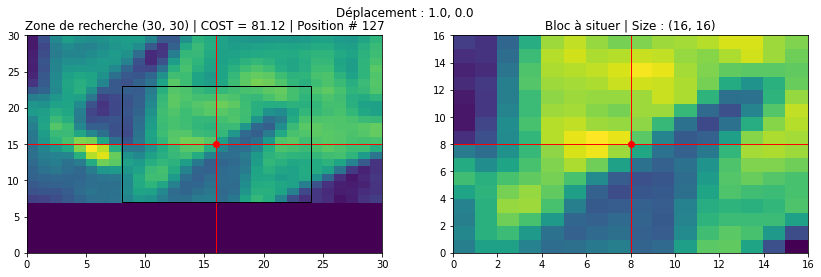

Coordonnées du déplacement optimal recentré 1.0 0.0


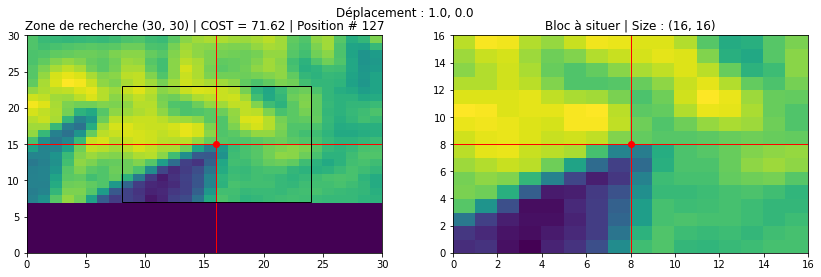

Coordonnées du déplacement optimal recentré 1.0 0.0


Déplacement moyen sur toute l'image : 0.0004975124378109452 0.0
>>> Done


In [59]:
img_t = np.array(Image.open("img/dbz_1_1.png"))[:,:,0]
img_tp1 = np.array(Image.open("img/dbz_1_2.png"))[:,:,0]
decoded, ipred = POC(img_t, img_tp1, bs, p, "SSD", debug = True)

### Version finale

On itère le processus sur les 3 canaux de l'image et on obtient le résultat suivant

In [22]:
def seq2mpeg(frame1, frame2, bs, p):
    """
    Calcul du déplacement sur les 3 canaux indépendemment et reconstruction de l'image prédite 
    au format RGB
    """
    n,m,c = np.shape(frame1)
    n_crop = n // bs  * bs
    m_crop = m // bs  * bs
    RGB = []
    for i in range(3):
        print(f'> Canal {i}...')
        
        frame1_i = frame1[:,:,i]
        frame2_i = frame2[:,:,i]
        # Flip pour l'affichage avec imshow dans le bon sens
        frame1_flipped_cropped = np.flip(frame1_i[:n_crop,:m_crop], axis = 0)
        frame2_flipped_cropped = np.flip(frame2_i[:n_crop,:m_crop], axis = 0)
        # Ajout du padding à la frame de réference
        frame_ref = cv2.copyMakeBorder(frame1_flipped_cropped, p,p,p,p, cv2.BORDER_CONSTANT)
        n,m = np.shape(frame_ref)
        frame_to_predict = np.copy(frame2_flipped_cropped)

        print('> Encoding ...')
        u = encode_motion(frame_ref, frame_to_predict, bs, p, "SSD", False)
        print(">>> Done")
        decoded = decode_motion(frame_ref, frame_to_predict, u, bs, p)
        RGB.append(decoded)
    fig, ax = plt.subplots(1,1, figsize = (15,10))
    plt.imshow(np.flip(np.dstack(RGB).astype(np.uint8), axis = 0))
    return RGB

> Canal 0...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -1.9431592039800996 0.8986318407960199
>>> Done
> Canal 1...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -1.8893034825870647 1.2522388059701492
>>> Done
> Canal 2...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Pr

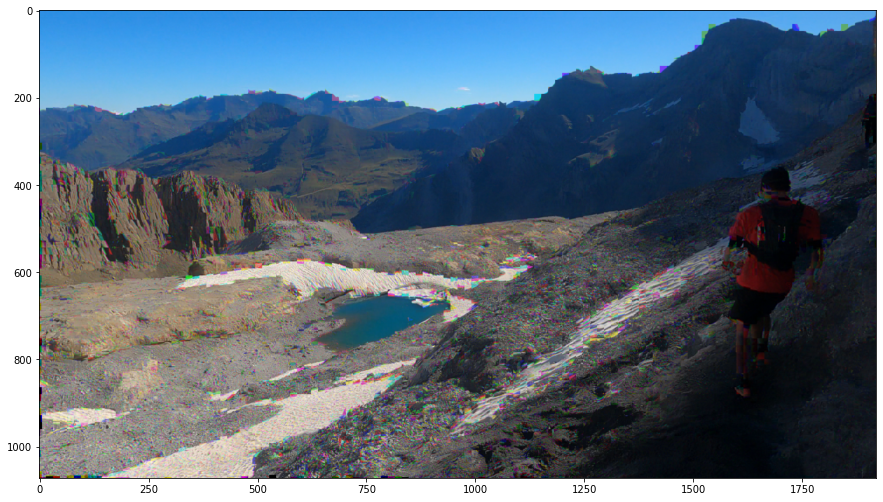

In [23]:
frame1 = np.array(Image.open("img/1.jpg"))
frame2 = np.array(Image.open("img/2.jpg"))
RGB = seq2mpeg(frame1, frame2, 16, 7)

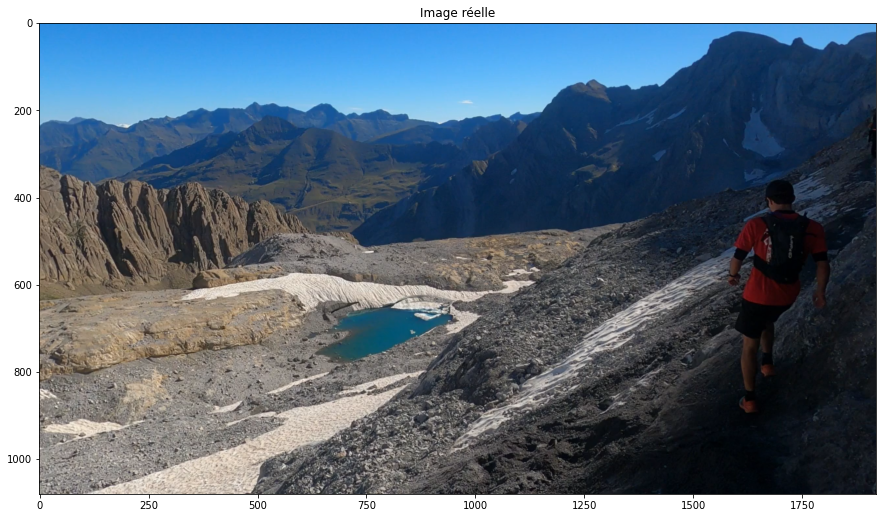

In [35]:
fig, ax = plt.subplots(1,1, figsize = (15,10))

plt.imshow(frame2)
plt.title("Image réelle")
plt.show()

## Démonstration avec d'autres séquences


> Canal 0...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : 0.5599502487562189 -0.019776119402985074
>>> Done
> Canal 1...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : 0.5864427860696517 -0.02599502487562189
>>> Done
> Canal 2...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%

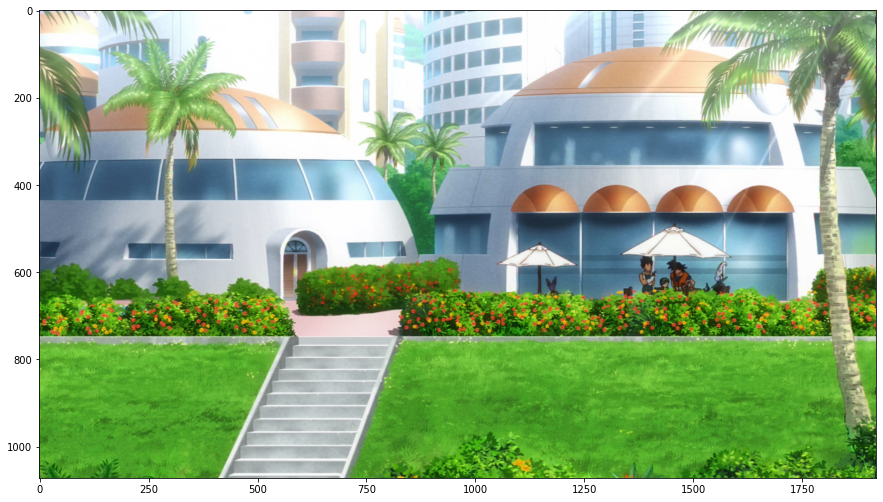

In [24]:
frame1 = np.array(Image.open("img/dbz_1_1.png"))
frame2 = np.array(Image.open("img/dbz_1_2.png"))

RGB = seq2mpeg(frame1, frame2, 16, 7)

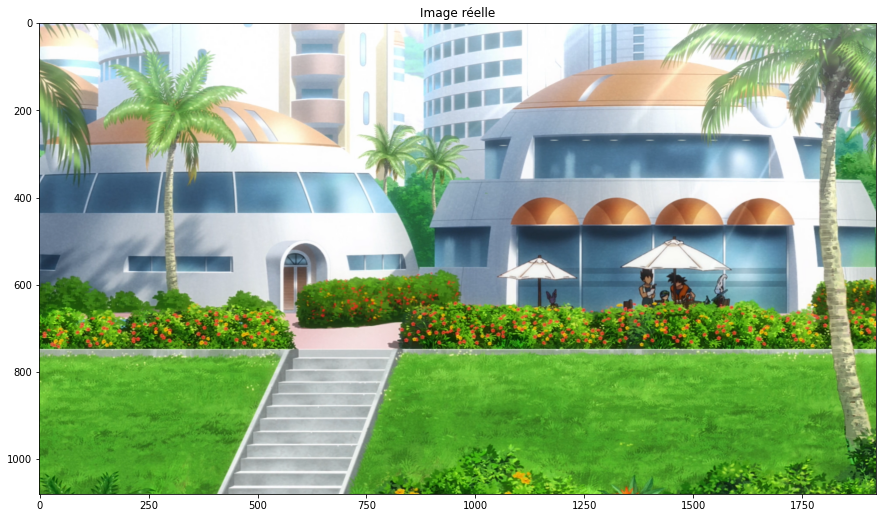

In [33]:
fig, ax = plt.subplots(1,1, figsize = (15,10))

plt.imshow(frame2)
plt.title("Image réelle")
plt.show()

> Canal 0...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -0.08532338308457711 -0.06393034825870647
>>> Done
> Canal 1...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -0.09228855721393035 -0.07238805970149254
>>> Done
> Canal 2...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50

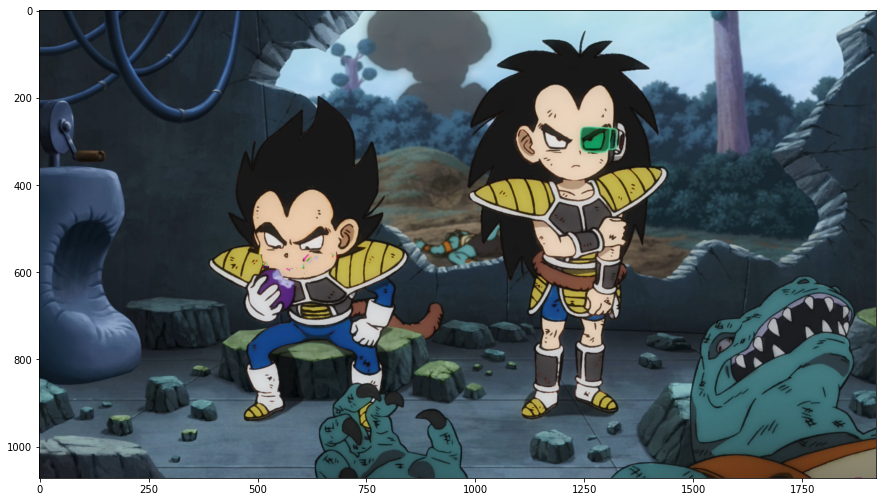

In [25]:
frame1 = np.array(Image.open("img/dbz_2_1.png"))
frame2 = np.array(Image.open("img/dbz_2_2.png"))
RGB = seq2mpeg(frame1, frame2, 16, 7)

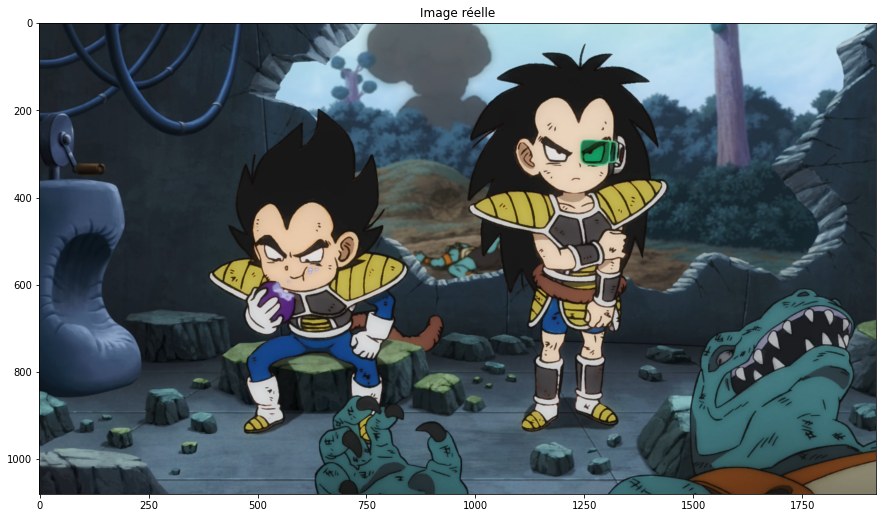

In [37]:
fig, ax = plt.subplots(1,1, figsize = (15,10))

plt.imshow(frame2)
plt.title("Image réelle")
plt.show()

Note : La bouche disparait sur le personnage de gauche.

> Canal 0...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -1.2085820895522388 -0.31144278606965176
>>> Done
> Canal 1...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0%
Progression : 60.0%
Progression : 70.0%
Progression : 80.0%
Progression : 90.0%
Déplacement moyen sur toute l'image : -1.4358208955223881 -0.07412935323383085
>>> Done
> Canal 2...
> Encoding ...
>> Similarity metric used :  SSD
>> 8040 blocs | 225 comparaisons par bloc
Progression : 0.0%
Progression : 10.0%
Progression : 20.0%
Progression : 30.0%
Progression : 40.0%
Progression : 50.0

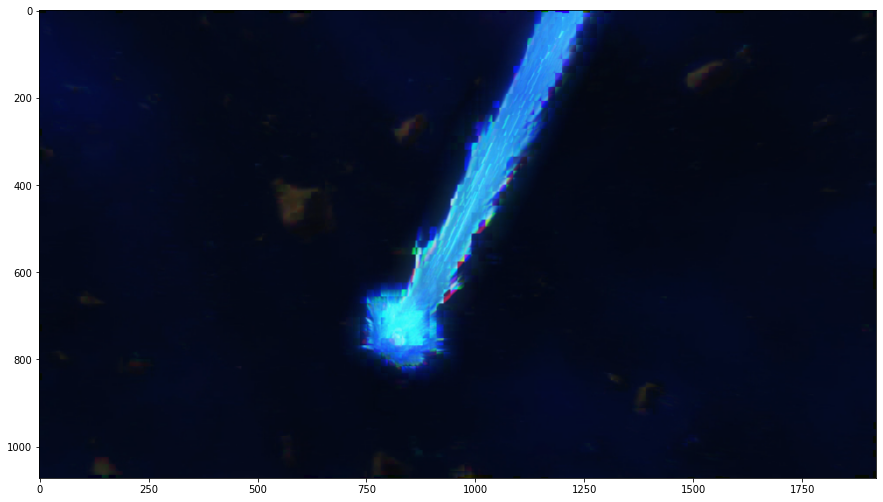

In [38]:
frame1 = np.array(Image.open("img/dbz_3_1.png"))
frame2 = np.array(Image.open("img/dbz_3_2.png"))
RGB = seq2mpeg(frame1, frame2, 16, 7)

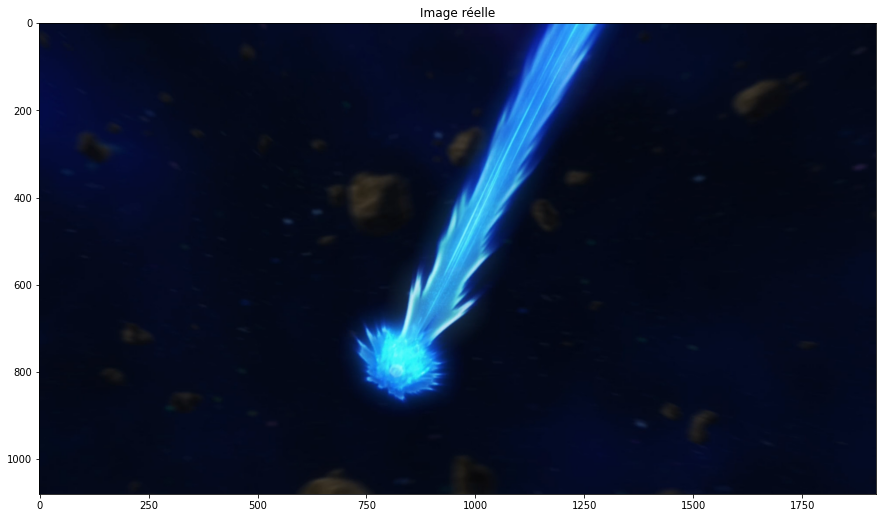

In [39]:
fig, ax = plt.subplots(1,1, figsize = (15,10))

plt.imshow(frame2)
plt.title("Image réelle")
plt.show()

## Calcul du taux de compression

On retrouve le taux de compression à partir de la taille des images de la séquence des images que l'on veut compresser et la taille du macrobloc.

Avec une taille de macrobloc 16x16, on compresse l'image 8 fois car on remplace chaque bloc de 16x16 pixels par un vecteur de taille 2 (en supposant que les espaces mémoires alloués soient de même taille pour les pixels et les vecteurs déplacements)

Au final, si on décide de n'utiliser que 3 I-frames par secondes, on se retrouve avec 21 P-frames.

In [47]:
(21 * 0.125 * 1 + 0.02 * 3)/24

0.111875